In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## Import các thư viện cần thiết và cấu hình

In [2]:
## Import cac thu vien can thiet
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from PIL import Image
import warnings
from tqdm import tqdm 
warnings.filterwarnings('ignore')

# TensorFlow va Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# Sklearn cho danh gia
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Thiet lap style cho bieu do
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')

# Kiem tra GPU
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

# Thiet lap seed de ket qua co the tai tao
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

2025-12-21 08:56:27.187325: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766307387.372157      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766307387.428975      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1766307387.886063      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766307387.886105      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766307387.886108      55 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
# =============================================
# CAU HINH CHO KAGGLE
# =============================================
CONFIG = {
    # KAGGLE PATHS
    'TRAIN_DIR': '/kaggle/input/Train',
    'CSV_PATH': r'/kaggle/input/train_data.csv',
    
    # Model params
    'IMG_SIZE': 224,
    'BATCH_SIZE': 32,
    'EPOCHS': 30,
    'VALIDATION_SPLIT': 0.2,
    'SEED': 42,
    'NUM_CLASSES': 4,
    'LEARNING_RATE': 1e-4,
    'VALIDATION_SPLIT': 0.2
}

CLASS_NAMES = ['Coccidiosis', 'Healthy', 'New Castle Disease', 'Salmonella']
NUM_CLASSES = len(CLASS_NAMES)
SEED = CONFIG['SEED']

np.random.seed(SEED)
tf.random.set_seed(SEED)

print("Configuration loaded!")

Configuration loaded!


## Khám phá dữ liệu(EDA)

In [4]:
# Doc file CSV
df = pd.read_csv(CONFIG['CSV_PATH'])

print("Thong tin co ban ve dataset:")
print(f"   Tong so mau: {len(df)}")
print(f"   So cot: {len(df.columns)}")
print("\n5 dong dau tien:")
df.head()

Thong tin co ban ve dataset:
   Tong so mau: 8067
   So cot: 2

5 dong dau tien:


,images,label
0,salmo.1558.jpg,Salmonella
1,cocci.1866.jpg,Coccidiosis
2,cocci.171.jpg,Coccidiosis
3,salmo.1484.jpg,Salmonella
4,ncd.100.jpg,New Castle Disease


Màu sắc trong dataset này có ý nghĩa y học (phân có máu vs phân bình thường). Vì vậy, không nên thay đổi màu sắc quá nhiều trong data augmentation để model vẫn học được sự khác biệt màu giữa các loại bệnh

## Tiền xử lý dữ liệu và Data Augmentation

In [ ]:
# Tao duong dan day du cho anh
df['image_path'] = df['images'].apply(lambda x: os.path.join(CONFIG['TRAIN_DIR'], x))
# Kiem tra xem tat ca anh co ton tai khong
df['exists'] = df['image_path'].apply(os.path.exists)
print(f"So anh ton tai: {df['exists'].sum()}/{len(df)}")
# Chi giu lai nhung anh ton tai
df = df[df['exists'] == True].copy()
print(f"So mau sau khi loc: {len(df)}")

So anh ton tai: 8067/8067
So mau sau khi loc: 8067


In [ ]:
# CUSTOM DATA SPLIT: 70% Train, 15% Val, 15% Test
from sklearn.model_selection import train_test_split
import pandas as pd
# Define Oversample Function for all classes
def balance_all_classes(df, target_col='label'):
    # Tìm số lượng mẫu của lớp lớn nhất
    max_size = df[target_col].value_counts().max()
    lst = [df]
    for class_index, group in df.groupby(target_col):
        # Tính số lượng cần thêm cho mỗi lớp thiểu số
        samples_needed = max_size - len(group)
        if samples_needed > 0:
            # Oversample các lớp ít hơn
            lst.append(group.sample(samples_needed, replace=True, random_state=SEED))
    return pd.concat(lst).sample(frac=1, random_state=SEED)
# 1. Split data into 70% Train and 30% Temp (Val + Test)
train_df, temp_df = train_test_split(df, test_size=0.3, random_state=SEED, stratify=df['label'])
# 2. Split Temp into 15% Val and 15% Test (50% of 30% is 15%)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=SEED, stratify=temp_df['label'])
print(f"Training Set Size: {len(train_df)} ({len(train_df)/len(df)*100:.2f}%)")
print(f"Validation Set Size: {len(val_df)} ({len(val_df)/len(df)*100:.2f}%)")
print(f"Test Set Size: {len(test_df)} ({len(test_df)/len(df)*100:.2f}%)")
# Oversample ALL minority classes to match the majority class
train_df_balanced = balance_all_classes(train_df)
print(f"Balanced Training Set Size: {len(train_df_balanced)}")
print(train_df_balanced['label'].value_counts())

Training Set Size: 5646 (69.99%)
Validation Set Size: 1210 (15.00%)
Test Set Size: 1211 (15.01%)
Balanced Training Set Size: 7348
label
Healthy               1837
New Castle Disease    1837
Salmonella            1837
Coccidiosis           1837
Name: count, dtype: int64


In [ ]:

import numpy as np
import cv2

def custom_augmentation(img):
    # 1. Gaussian Blur (30%)
    if np.random.random() < 0.3:
        img = cv2.GaussianBlur(img, (3, 3), 0)
    
    # 2. Random Noise (30%)
    if np.random.random() < 0.3:
        noise = np.random.normal(0, 5, img.shape)
        img = np.clip(img + noise, 0, 255)
    return img.astype(np.float32)

train_datagen = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='reflect',
    preprocessing_function=custom_augmentation
)
val_datagen = ImageDataGenerator()

In [15]:

# Data Generators
# Note: validation_split is REMOVED from ImageDataGenerator because we manually split the dataframes

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df_balanced,
    x_col='image_path',
    y_col='label',
    target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']),
    batch_size=CONFIG['BATCH_SIZE'],
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='image_path',
    y_col='label',
    target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']),
    batch_size=CONFIG['BATCH_SIZE'],
    class_mode='categorical',
    shuffle=False
)

test_generator = val_datagen.flow_from_dataframe(  # Use val_datagen (no aug) for test
    dataframe=test_df,
    x_col='image_path',
    y_col='label',
    target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']),
    batch_size=CONFIG['BATCH_SIZE'],
    class_mode='categorical',
    shuffle=False
)

# Class Indices
class_indices = train_generator.class_indices
print("\nClass Indices:")
print(class_indices)
idx_to_class = {v: k for k, v in class_indices.items()}


Found 7348 validated image filenames belonging to 4 classes.
Found 1210 validated image filenames belonging to 4 classes.
Found 1211 validated image filenames belonging to 4 classes.

Class Indices:
{'Coccidiosis': 0, 'Healthy': 1, 'New Castle Disease': 2, 'Salmonella': 3}


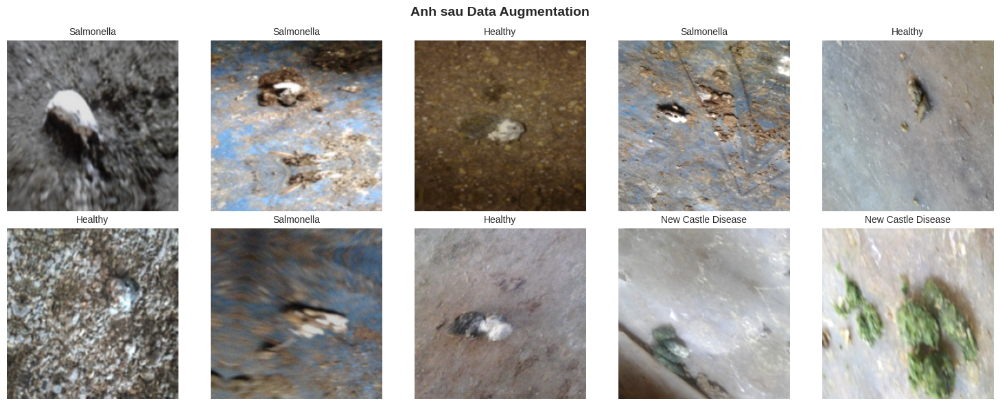

In [ ]:
# Visualize Data Augmentation
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

# Lay mot batch tu train generator
sample_batch = next(train_generator)
sample_images = sample_batch[0][:10]
sample_labels = sample_batch[1][:10]
for i, (img, label) in enumerate(zip(sample_images, sample_labels)):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(img.astype('uint8'))
    axes[row, col].axis('off')
    class_idx = np.argmax(label)
    axes[row, col].set_title(idx_to_class[class_idx], fontsize=10)
plt.suptitle('Anh sau Data Augmentation', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Reset generator
train_generator.reset()

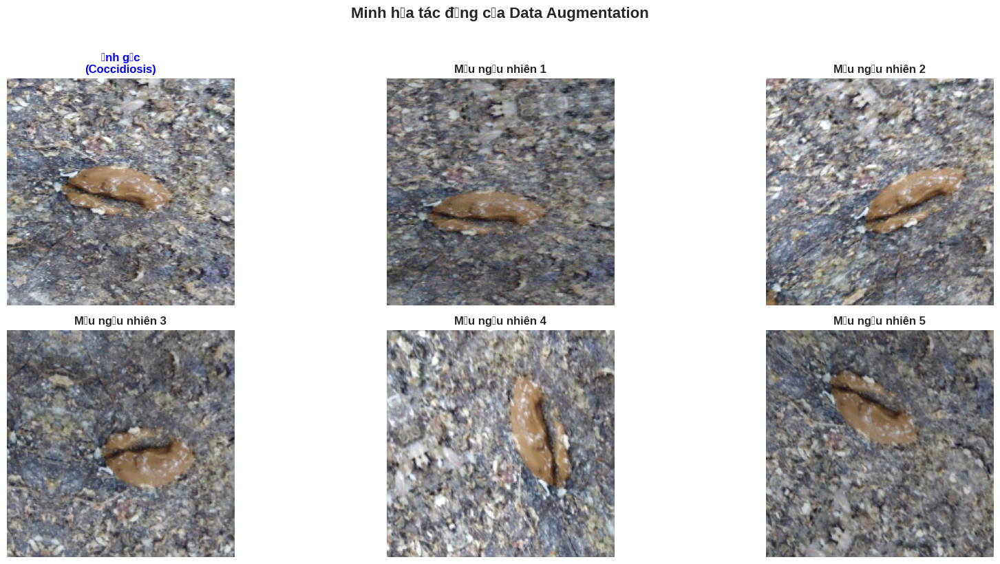

In [ ]:
# So sánh Ảnh gốc và các biến thể sau Data Augmentation
# Chọn một ảnh ngẫu nhiên từ train_df_balanced
sample_row = train_df_balanced.sample(1).iloc[0]
img_path = sample_row['image_path']
label = sample_row['label']
# Đọc ảnh gốc
original_img = cv2.imread(img_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
original_img = cv2.resize(original_img, (CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']))

# Chuẩn bị plot
plt.figure(figsize=(18, 8))

# Hiển thị ảnh gốc
plt.subplot(2, 3, 1)
plt.imshow(original_img)
plt.title(f"Ảnh gốc\n({label})", fontsize=12, color='blue', fontweight='bold')
plt.axis('off')

# Tạo 5 biến thể augmentation từ cùng một ảnh gốc
# Chúng ta sử dụng ImageDataGenerator đã cấu hình (train_datagen)
# Lưu ý: img cần được mở rộng dimension để flow() nhận diện
img_array = np.expand_dims(original_img, 0)
aug_iter = train_datagen.flow(img_array, batch_size=1)

# Sử dụng tiêu đề ngẫu nhiên vì ImageDataGenerator áp dụng tổ hợp nhiều phép biến đổi cùng lúc
for i in range(5):
    plt.subplot(2, 3, i + 2)
    
    # Lấy ảnh đã qua augmentation chuẩn (ImageDataGenerator bao gồm preprocessing_function)
    aug_batch = next(aug_iter)
    aug_img = aug_batch[0] # aug_img là float32 nhưng giá trị vẫn nằm trong [0, 255] (không rescale)
    
    # Hiển thị ảnh
    plt.imshow(aug_img.astype('uint8'))
    plt.title(f"Mẫu ngẫu nhiên {i+1}", fontsize=12, fontweight='bold')
    plt.axis('off')

plt.suptitle('Minh họa tác động của Data Augmentation', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


## Model ResNet50

In [18]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

# ================================
# RESNET50 BACKBONE (PRETRAINED)
# ================================
base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3)
)

# Freeze toàn bộ backbone ban đầu
base_model.trainable = False

# ================================
# CUSTOM CLASSIFICATION HEAD
# ================================
inputs = layers.Input(shape=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3))

# Chuẩn preprocess đúng chuẩn ResNet50
x = preprocess_input(inputs)

x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)

x = layers.BatchNormalization()(x)

from tensorflow.keras import regularizers

x = layers.Dense(
    128,
    activation='relu',
    kernel_regularizer=regularizers.l2(1e-4)
)(x)

x = layers.Dropout(0.3)(x)

outputs = layers.Dense(CONFIG['NUM_CLASSES'], activation='softmax')(x)

model = models.Model(inputs, outputs, name="ResNet50_FineTune")

# ================================
# COMPILE (PHASE 1 - HEAD TRAIN)
# ================================
model.compile(
    optimizer=Adam(
        learning_rate=3e-4,   # LR thấp hơn
        clipnorm=1.0          # <<< GRADIENT CLIPPING Ở ĐÂY
    ),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

model.summary()


I0000 00:00:1766307505.419472      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "ResNet50_FineTune"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 2048)      │      8,192 │ global_average_p… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │    262,272 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 4)         │        516 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,858,692 (91.01 MB)

 Trainable params: 266,884 (1.02 MB)

 Non-trainable params: 23,591,808 (90.00 MB)

Import kiến trúc ResNet50 pretrained trên ImageNet cùng với hàm preprocess_input đặc trưng của ResNet50.

Hàm preprocess_input có nhiệm vụ chuẩn hóa ảnh đầu vào về đúng phân phối dữ liệu mà ResNet50 đã được huấn luyện trước đó (chuẩn ImageNet).  
Việc sử dụng đúng hàm preprocess là bắt buộc khi áp dụng transfer learning, nếu không mô hình sẽ học kém hoặc hội tụ sai.


Khởi tạo ResNet50 pretrained trên ImageNet và sử dụng nó như một backbone trích xuất đặc trưng.

Tham số include_top=False giúp loại bỏ phần fully connected gốc (1000 lớp ImageNet), vì bài toán hiện tại chỉ cần phân loại 4 bệnh.

Toàn bộ backbone được đóng băng (trainable = False) trong giai đoạn đầu để:
- Giữ nguyên các đặc trưng tổng quát đã học
- Giúp mô hình hội tụ nhanh hơn
- Giảm nguy cơ overfitting khi dataset không quá lớn


Định nghĩa đầu vào của mô hình với kích thước ảnh 224×224×3.

Ảnh đầu vào được đưa qua hàm preprocess_input để chuẩn hóa theo chuẩn ResNet50.  
Sau đó, dữ liệu được truyền qua backbone ResNet50 để trích xuất đặc trưng.

Tham số training=False đảm bảo các lớp Batch Normalization trong backbone hoạt động ở chế độ inference, giúp mô hình ổn định hơn khi backbone bị đóng băng.


Global Average Pooling được sử dụng để gom toàn bộ feature map thành một vector đặc trưng duy nhất.

So với Fully Connected truyền thống, kỹ thuật này:
- Giảm mạnh số lượng tham số
- Hạn chế overfitting
- Giữ lại thông tin đặc trưng quan trọng nhất của ảnh


Xây dựng phần classification head cho mô hình ResNet50.

Batch Normalization giúp ổn định phân phối đặc trưng trước khi vào Dense layer.  
Dense layer 128 neuron học các đặc trưng bậc cao từ backbone ResNet50.

L2 regularization được thêm vào Dense layer để hạn chế trọng số lớn, giúp giảm overfitting.  
Dropout 0.3 được sử dụng nhằm tăng khả năng tổng quát hóa mà vẫn giữ được đủ thông tin đặc trưng.


Lớp Dense cuối cùng với hàm Softmax trả về xác suất dự đoán cho 4 lớp bệnh.

Toàn bộ mô hình được kết hợp từ input, backbone ResNet50 và classification head tùy chỉnh, tạo thành mô hình hoàn chỉnh ResNet50_FineTune.


Cấu hình mô hình cho giai đoạn huấn luyện đầu tiên (Head Training).

Optimizer Adam được sử dụng với learning rate vừa phải (3e-4) để huấn luyện classification head.  
Gradient clipping (clipnorm=1.0) được thêm vào nhằm tránh hiện tượng gradient explosion, giúp quá trình học ổn định hơn.

Label smoothing được sử dụng để tránh mô hình dự đoán quá tự tin, từ đó cải thiện khả năng tổng quát hóa.


## Huấn luyện Model

In [ ]:
# Callbacks cai thien
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=8,             
    restore_best_weights=True,
    verbose=1
)

# Model checkpoint
model_checkpoint = ModelCheckpoint(
    'best_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)
# Reduce LR on plateau - dieu chinh tot hon
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,     
    patience=4,     
    min_lr=1e-6,    
    verbose=1
)
# Warmup scheduler (optional nhung hieu qua)
def warmup_scheduler(epoch, lr):
    warmup_epochs = 3
    if epoch < warmup_epochs:
        return lr * ((epoch + 1) / warmup_epochs)
    return lr

callbacks = [early_stopping, model_checkpoint, reduce_lr]
# Neu muon dung warmup, them: callbacks = [warmup_callback, early_stopping, model_checkpoint, reduce_lr]

In [20]:
# Tinh steps per epoch
steps_per_epoch = len(train_df_balanced) // CONFIG['BATCH_SIZE']
validation_steps = len(val_df) // CONFIG['BATCH_SIZE']

print(f"Training configuration:")
print(f"   Steps per epoch: {steps_per_epoch}")
print(f"   Validation steps: {validation_steps}")
print(f"   Total epochs: {CONFIG['EPOCHS']}")

Training configuration:
   Steps per epoch: 229
   Validation steps: 37
   Total epochs: 30


In [21]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // CONFIG['BATCH_SIZE'],
    epochs=CONFIG['EPOCHS'],
    validation_data=val_generator,
    validation_steps=val_generator.samples // CONFIG['BATCH_SIZE'],
    callbacks=callbacks,
    verbose=1
)


Epoch 1/30


I0000 00:00:1766307517.070730     124 service.cc:152] XLA service 0x797798013dc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1766307517.070777     124 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1766307519.329235     124 cuda_dnn.cc:529] Loaded cuDNN version 91002


  2/229 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.2734 - loss: 2.0589 

I0000 00:00:1766307524.090349     124 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


229/229 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - accuracy: 0.7123 - loss: 1.0294
Epoch 1: val_accuracy improved from -inf to 0.93497, saving model to best_model.keras
229/229 ━━━━━━━━━━━━━━━━━━━━ 129s 503ms/step - accuracy: 0.7127 - loss: 1.0286 - val_accuracy: 0.9350 - val_loss: 0.5565 - learning_rate: 3.0000e-04
Epoch 2/30
  1/229 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.8438 - loss: 0.7286
Epoch 2: val_accuracy did not improve from 0.93497
229/229 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.8438 - loss: 0.7286 - val_accuracy: 0.9341 - val_loss: 0.5562 - learning_rate: 3.0000e-04
Epoch 3/30
229/229 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step - accuracy: 0.8773 - loss: 0.6755
Epoch 3: val_accuracy did not improve from 0.93497
229/229 ━━━━━━━━━━━━━━━━━━━━ 105s 458ms/step - accuracy: 0.8773 - loss: 0.6755 - val_accuracy: 0.9316 - val_loss: 0.5535 - learning_rate: 3.0000e-04
Epoch 4/30
  1/229 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.8750 - loss: 0.6111
Epoch 4: val_accuracy did n

Tiến hành huấn luyện mô hình trong giai đoạn 1, khi backbone ResNet50 vẫn bị đóng băng.

Mục tiêu của giai đoạn này là giúp classification head thích nghi với dữ liệu bệnh ở gà trước khi fine-tuning sâu toàn bộ mạng.


In [22]:
# ================================
# PHASE 2 - FINE TUNING
# ================================

# Unfreeze 30 layer cuối của ResNet50
for layer in base_model.layers[-30:]:
    layer.trainable = True

# Compile lại với LR nhỏ + label smoothing
model.compile(
    optimizer=Adam(
        learning_rate=3e-5,   # LR nhỏ cho fine-tune
        clipnorm=1.0          # <<< THÊM Ở ĐÂY
    ),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)


print("Fine-tuning last 30 layers of ResNet50")
model.summary()

# Train fine-tune
fine_tune_epochs = 20

history_finetune = model.fit(
    train_generator,
    epochs=fine_tune_epochs,
    validation_data=val_generator,
    callbacks=callbacks,
    verbose=1
)

Fine-tuning last 30 layers of ResNet50


Model: "ResNet50_FineTune"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 2048)      │      8,192 │ global_average_p… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │    262,272 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 4)         │        516 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,858,692 (91.01 MB)

 Trainable params: 14,717,060 (56.14 MB)

 Non-trainable params: 9,141,632 (34.87 MB)

Epoch 1/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step - accuracy: 0.9559 - loss: 0.5170
Epoch 1: val_accuracy did not improve from 0.96959
230/230 ━━━━━━━━━━━━━━━━━━━━ 143s 526ms/step - accuracy: 0.9559 - loss: 0.5170 - val_accuracy: 0.9579 - val_loss: 0.4979 - learning_rate: 3.0000e-05
Epoch 2/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - accuracy: 0.9653 - loss: 0.4908
Epoch 2: val_accuracy did not improve from 0.96959
230/230 ━━━━━━━━━━━━━━━━━━━━ 107s 465ms/step - accuracy: 0.9653 - loss: 0.4908 - val_accuracy: 0.9645 - val_loss: 0.4811 - learning_rate: 3.0000e-05
Epoch 3/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - accuracy: 0.9715 - loss: 0.4782
Epoch 3: val_accuracy improved from 0.96959 to 0.97025, saving model to best_model.keras
230/230 ━━━━━━━━━━━━━━━━━━━━ 107s 466ms/step - accuracy: 0.9715 - loss: 0.4782 - val_accuracy: 0.9702 - val_loss: 0.4720 - learning_rate: 3.0000e-05
Epoch 4/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - accuracy: 0.9733 - loss: 0.4705
Epoch 4: v

Mở khóa 30 lớp cuối của ResNet50 để fine-tuning.

Các lớp này chứa các đặc trưng bậc cao, phù hợp để tinh chỉnh cho bài toán phân loại bệnh, trong khi vẫn giữ nguyên các đặc trưng thấp ở các lớp đầu.


Sau khi mở khóa một phần backbone, mô hình được compile lại với learning rate nhỏ hơn để fine-tuning.

Việc giảm learning rate giúp tránh làm thay đổi mạnh các trọng số pretrained và đảm bảo quá trình huấn luyện diễn ra ổn định.


Thực hiện fine-tuning mô hình ResNet50.

Mô hình được huấn luyện sâu hơn để thích nghi tốt hơn với đặc trưng màu sắc và kết cấu của phân gà, từ đó cải thiện độ chính xác so với giai đoạn chỉ huấn luyện classification head.


In [23]:

# Luu model
model.save('best_model.keras')

# Hoac dung trong ModelCheckpoint
ModelCheckpoint(
    'best_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

## Đánh giá model và Visualization

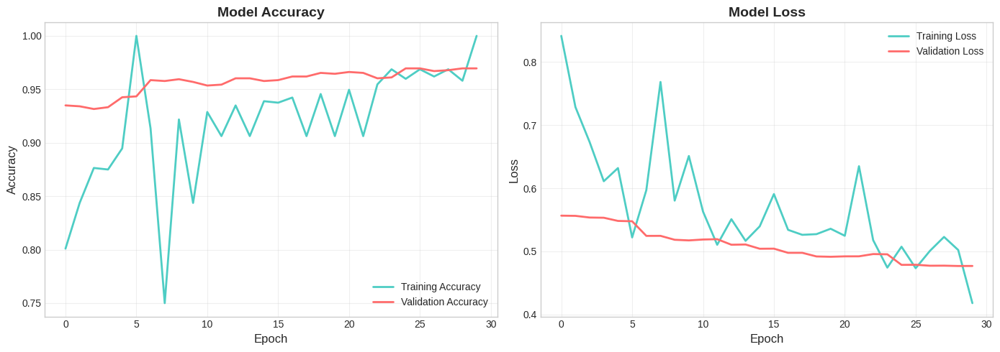

Da luu bieu do: training_curves.png


In [24]:
# Ve bieu do Training History
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot Accuracy
axes[0].plot(history.history['accuracy'], label='Training Accuracy', linewidth=2, color='#4ECDC4')
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, color='#FF6B6B')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
axes[0].legend(loc='lower right')
axes[0].grid(True, alpha=0.3)
# Plot Loss
axes[1].plot(history.history['loss'], label='Training Loss', linewidth=2, color='#4ECDC4')
axes[1].plot(history.history['val_loss'], label='Validation Loss', linewidth=2, color='#FF6B6B')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu bieu do: training_curves.png")

In [25]:
# Load best model
best_model = tf.keras.models.load_model('best_model.keras')
print("Da load best model")

# Danh gia tren validation set
val_generator.reset()
val_loss, val_accuracy = best_model.evaluate(val_generator, verbose=1)

print(f"\nKet qua danh gia tren Validation Set:")
print(f"Loss: {val_loss:.4f}")
print(f"Accuracy: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")

Da load best model
38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - accuracy: 0.9708 - loss: 0.4530

Ket qua danh gia tren Validation Set:
Loss: 0.4415
Accuracy: 0.9744 (97.44%)


In [26]:
# Du doan tren validation set
val_generator.reset()
predictions = best_model.predict(val_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# Lay true labels
true_classes = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

print(f"\nSo mau du doan: {len(predicted_classes)}")
print(f"So mau thuc te: {len(true_classes)}")

38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step

So mau du doan: 1210
So mau thuc te: 1210


In [27]:
# Classification Report
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


CLASSIFICATION REPORT
                    precision    recall  f1-score   support

       Coccidiosis       0.98      0.98      0.98       371
           Healthy       0.95      0.97      0.96       360
New Castle Disease       1.00      0.98      0.99        85
        Salmonella       0.98      0.97      0.98       394

          accuracy                           0.97      1210
         macro avg       0.98      0.97      0.98      1210
      weighted avg       0.97      0.97      0.97      1210



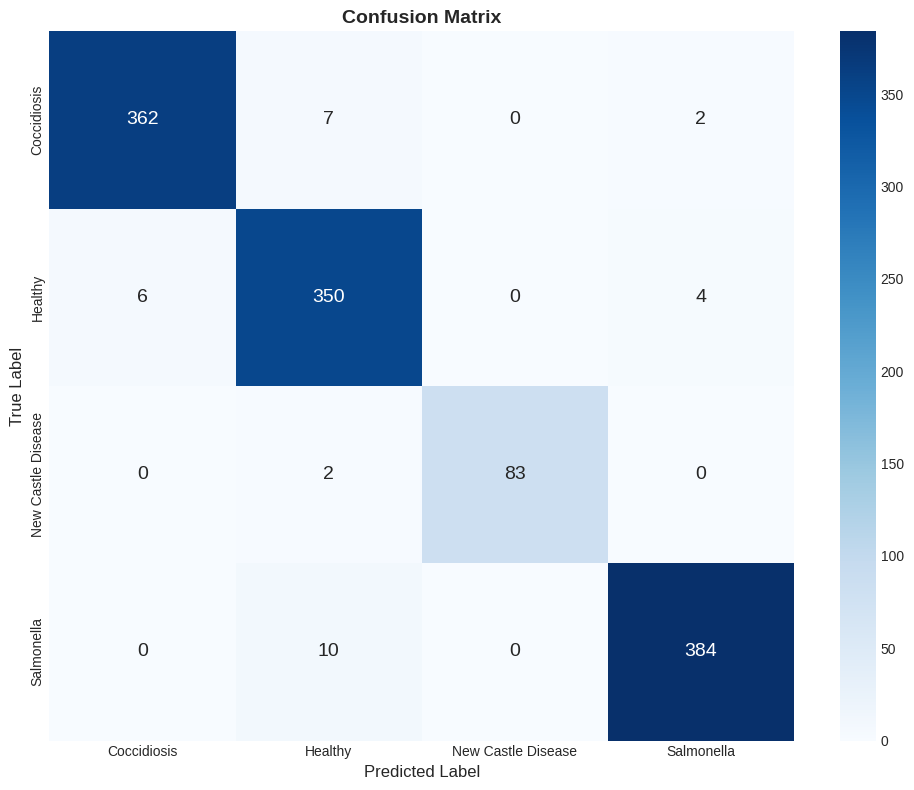

Da luu: confusion_matrix.png


In [28]:
# Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_labels, yticklabels=class_labels,
            annot_kws={'size': 14})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu: confusion_matrix.png")

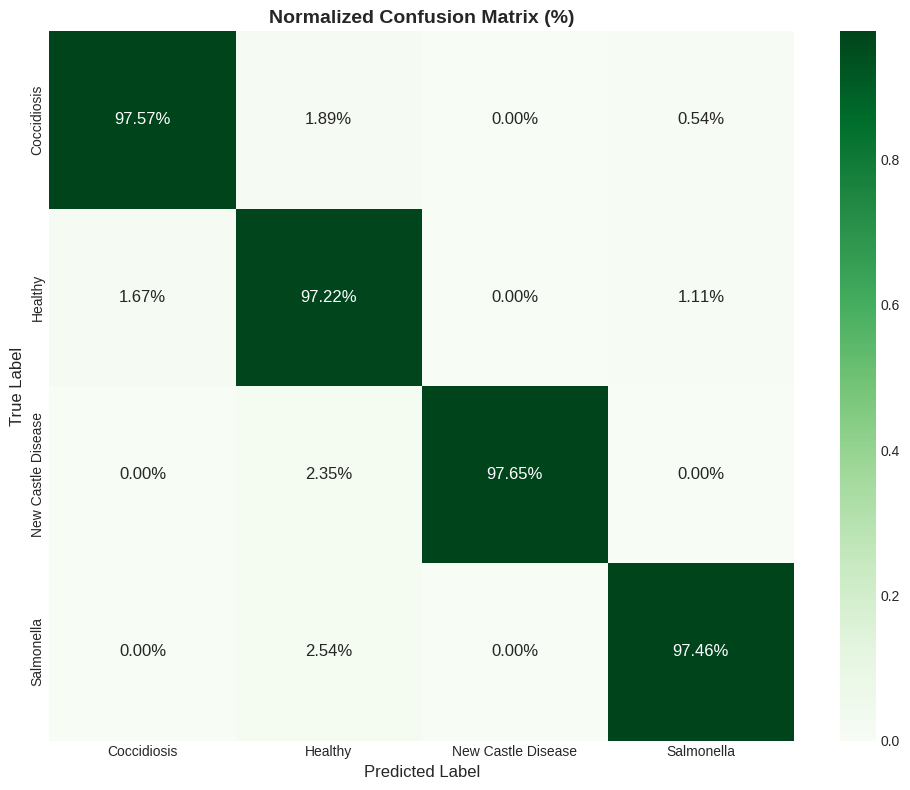

Da luu: confusion_matrix_normalized.png


In [29]:
# Normalized Confusion Matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', 
            xticklabels=class_labels, yticklabels=class_labels,
            annot_kws={'size': 12})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Normalized Confusion Matrix (%)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix_normalized.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu: confusion_matrix_normalized.png")

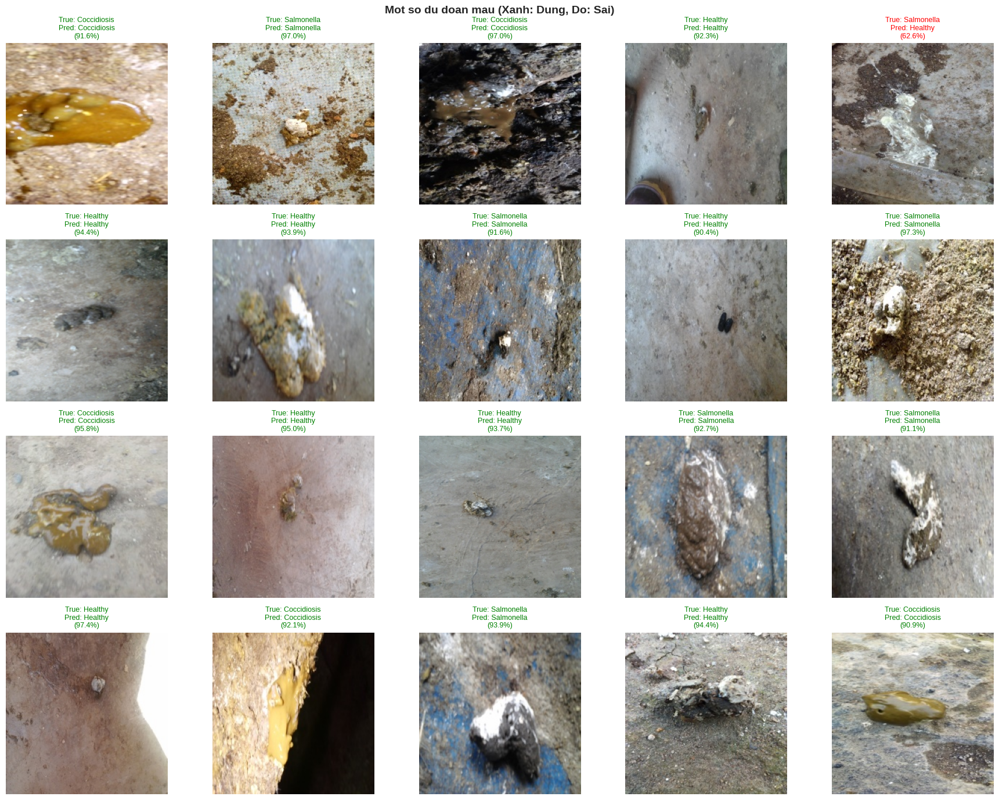

Da luu: sample_predictions.png


In [30]:
# Hien thi mot so du doan mau
fig, axes = plt.subplots(4, 5, figsize=(18, 14))

# Reset generator va lay batch
val_generator.reset()
sample_batch = next(val_generator)
sample_images = sample_batch[0][:20]
sample_true_labels = np.argmax(sample_batch[1][:20], axis=1)

# Du doan
sample_predictions = best_model.predict(sample_images, verbose=0)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
sample_confidences = np.max(sample_predictions, axis=1)

for i in range(20):
    row = i // 5
    col = i % 5
    
    axes[row, col].imshow(sample_images[i].astype('uint8'))
    axes[row, col].axis('off')
    
    true_label = class_labels[sample_true_labels[i]]
    pred_label = class_labels[sample_pred_labels[i]]
    confidence = sample_confidences[i] * 100
    
    # Mau xanh neu dung, do neu sai
    color = 'green' if sample_true_labels[i] == sample_pred_labels[i] else 'red'
    
    title = f"True: {true_label}\nPred: {pred_label}\n({confidence:.1f}%)"
    axes[row, col].set_title(title, fontsize=9, color=color)

plt.suptitle('Mot so du doan mau (Xanh: Dung, Do: Sai)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('sample_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu: sample_predictions.png")

[*] Đang thực hiện dự đoán trên tập dữ liệu (1210 mẫu)...
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

[+] KẾT QUẢ PHÂN TÍCH:
 - Tổng số ảnh kiểm tra: 1210
 - Số lượng ảnh sai: 31
 - Độ chính xác thực tế: 97.44%
 - Danh sách chi tiết đã lưu vào: 'misclassified_analysis.csv'


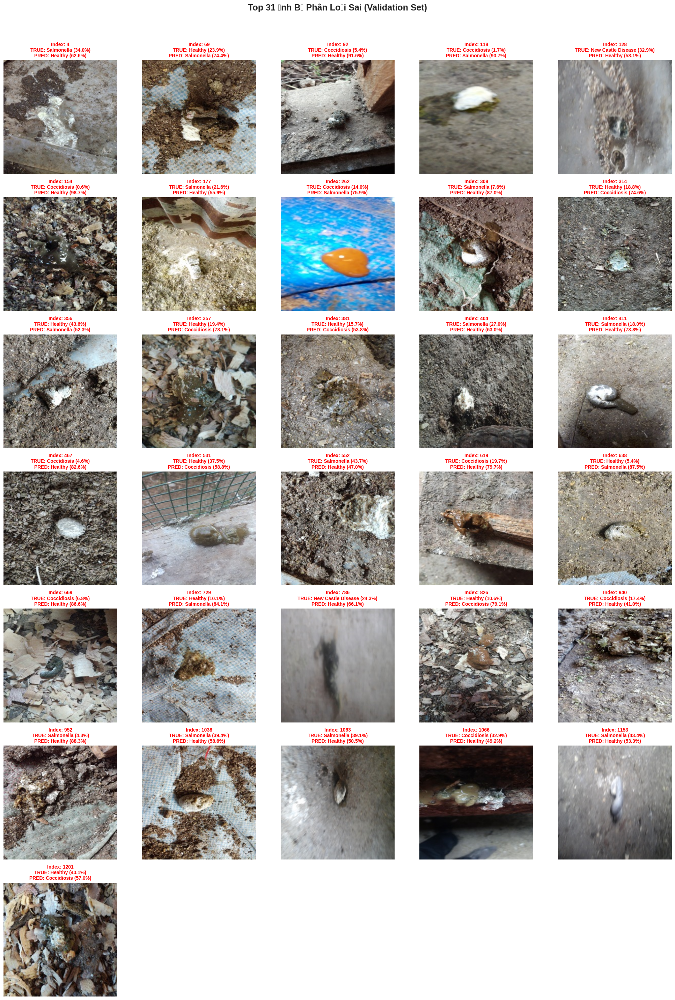

In [31]:
# ==============================================================================
# TỐI ƯU HIỂN THỊ ẢNH BỊ PHÂN LOẠI SAI (MISCLASSIFIED IMAGES ANALYSIS)
# ==============================================================================
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img

def analyze_misclassified(model, generator, num_images=30):
    print(f"[*] Đang thực hiện dự đoán trên tập dữ liệu ({len(generator.classes)} mẫu)...")
    generator.reset()
    
    # 1. Dự đoán và lấy xác suất
    preds = model.predict(generator, verbose=1)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())
    
    # 2. Xác định các chỉ số bị sai
    errors = np.where(pred_classes != true_classes)[0]
    total_samples = len(true_classes)
    accuracy = (total_samples - len(errors)) / total_samples
    print(f"\n[+] KẾT QUẢ PHÂN TÍCH:")
    print(f" - Tổng số ảnh kiểm tra: {total_samples}")
    print(f" - Số lượng ảnh sai: {len(errors)}")
    print(f" - Độ chính xác thực tế: {accuracy:.2%}")

    if len(errors) == 0:
        print("[!] Tuyệt vời! Không có ảnh nào bị phân loại sai.")
        return [], errors, preds

    # 3. Tạo DataFrame quản lý thông tin lỗi
    error_details = []
    for idx in errors:
        true_label = class_labels[true_classes[idx]]
        pred_label = class_labels[pred_classes[idx]]
        true_prob = preds[idx][true_classes[idx]] * 100
        pred_prob = preds[idx][pred_classes[idx]] * 100
        
        error_details.append({
            'index': idx,
            'filename': os.path.basename(generator.filepaths[idx]),
            'path': generator.filepaths[idx],
            'true_label': true_label,
            'pred_label': pred_label,
            'true_conf': true_prob,
            'pred_conf': pred_prob
        })
    
    df_errors = pd.DataFrame(error_details)
    df_errors.to_csv('misclassified_analysis.csv', index=False)
    print(f" - Danh sách chi tiết đã lưu vào: 'misclassified_analysis.csv'")

    # 4. Hiển thị trực quan (optimized grid)
    to_show = min(len(errors), num_images)
    cols = 5
    rows = (to_show + cols - 1) // cols
    
    plt.figure(figsize=(20, 4 * rows))
    for i in range(to_show):
        err = error_details[i]
        try:
            img = load_img(err['path'], target_size=(224, 224))
            plt.subplot(rows, cols, i + 1)
            plt.imshow(img)
            title = (f"Index: {err['index']}\n"
                     f"TRUE: {err['true_label']} ({err['true_conf']:.1f}%)\n"
                     f"PRED: {err['pred_label']} ({err['pred_conf']:.1f}%)")
            plt.title(title, color='red', fontsize=10, fontweight='bold')
            plt.axis('off')
        except Exception as e:
            print(f"[!] Lỗi hiển thị ảnh {err['filename']}: {e}")
            
    plt.suptitle(f"Top {to_show} Ảnh Bị Phân Loại Sai (Validation Set)", fontsize=18, y=1.02, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return df_errors, errors, preds

# Thực thi phân tích
df_mis, err_idx, raw_preds = analyze_misclassified(best_model, val_generator, num_images=40)



Evaluating on Test Set...
38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 182ms/step - accuracy: 0.9710 - loss: 0.4406
Test Loss: 0.4470798075199127
Test Accuracy: 0.9719240069389343
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step

Test Set Classification Report:
                    precision    recall  f1-score   support

       Coccidiosis       0.97      0.97      0.97       372
           Healthy       0.97      0.96      0.97       361
New Castle Disease       0.96      0.98      0.97        84
        Salmonella       0.98      0.98      0.98       394

          accuracy                           0.97      1211
         macro avg       0.97      0.97      0.97      1211
      weighted avg       0.97      0.97      0.97      1211



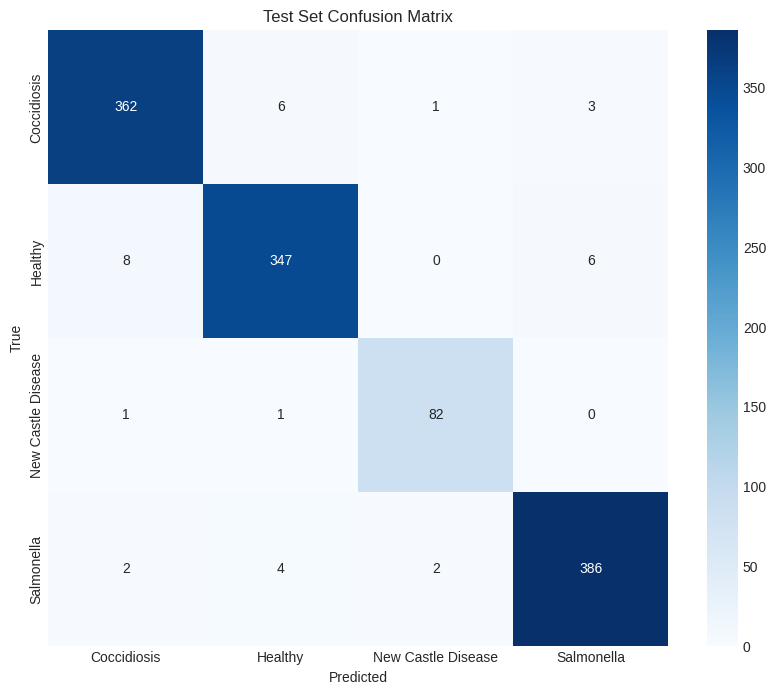

In [32]:

# Evaluate on TEST Set
print("\nEvaluating on Test Set...")
test_loss, test_accuracy = best_model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Confusion Matrix for Test Set
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Predictions
test_generator.reset()
predictions = best_model.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Classification Report
print("\nTest Set Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Confusion Matrix Heatmap
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Test Set Confusion Matrix')
plt.show()
